In [31]:
import pandas as pd
import os
import dotenv
import matplotlib.pyplot as plt
import torchaudio
import seaborn as sns
from scipy import signal
import numpy as np
import math
import IPython.display as ipd

In [18]:
dotenv.load_dotenv()

BASE_PATH = os.getenv('BASE_PATH')

TRAIN_DATA_PATH = os.path.join(BASE_PATH, 'data', 'train.csv')
VALID_DATA_PATH = os.path.join(BASE_PATH, 'data', 'valid.csv')
TEST_DATA_PATH  = os.path.join(BASE_PATH, 'data', 'test.csv')

TRAIN_DIR_PATH = os.path.join(BASE_PATH, 'data', 'train')
VALID_DIR_PATH = os.path.join(BASE_PATH, 'data', 'valid')
TEST_DIR_PATH  = os.path.join(BASE_PATH, 'data', 'test')

train_df = pd.read_csv(TRAIN_DATA_PATH)
valid_df = pd.read_csv(VALID_DATA_PATH)
test_df  = pd.read_csv(TEST_DATA_PATH)

In [4]:
print(
    f'shape of training data    = {train_df.shape}\n'
    f'shape of validating data  = {valid_df.shape}\n'
    f'shape of testing data     = {test_df.shape}'
)

shape of training data    = (480, 2)
shape of validating data  = (96, 2)
shape of testing data     = (105, 2)


In [5]:
print(
    f"duplicates in train.csv = {train_df.duplicated().sum()}\n"
    f"duplicates in valid.csv = {valid_df.duplicated().sum()}\n"
    f"duplicates in test.csv  = {test_df.duplicated().sum()}"
)

duplicates in train.csv = 0
duplicates in valid.csv = 0
duplicates in test.csv  = 0


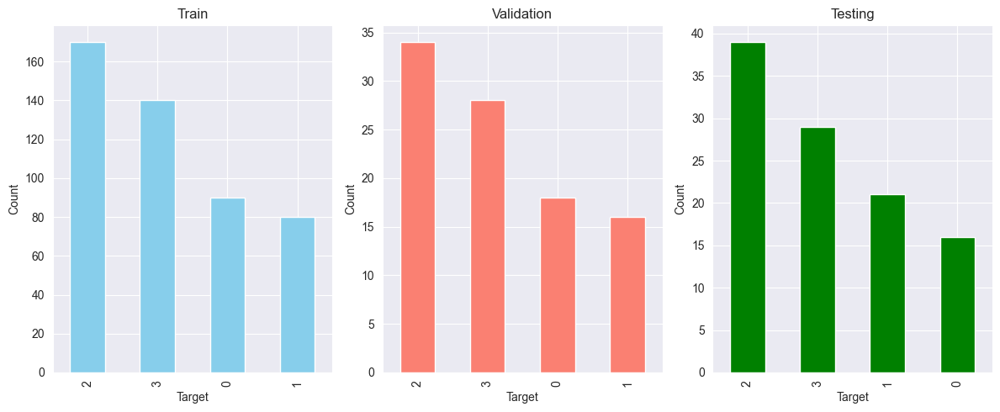

In [7]:
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

train_df['target'].value_counts().plot(kind='bar', ax=axes[0], color='skyblue')
axes[0].set_title("Train")
axes[0].set_xlabel("Target")
axes[0].set_ylabel("Count")

valid_df['target'].value_counts().plot(kind='bar', ax=axes[1], color='salmon')
axes[1].set_title("Validation")
axes[1].set_xlabel("Target")
axes[1].set_ylabel("Count")

test_df['target'].value_counts().plot(kind='bar', ax=axes[2], color='green')
axes[2].set_title("Testing")
axes[2].set_xlabel("Target")
axes[2].set_ylabel("Count")

plt.tight_layout()
plt.show()

In [21]:
def get_audio_metadata(file_path: str, basepath: str = None):

    file_path = os.path.join(basepath, file_path)
    metadata = torchaudio.info(file_path)

    sample_rate  = metadata.sample_rate
    num_channels = metadata.num_channels
    num_frames   = metadata.num_frames
    duration     = num_frames / sample_rate if sample_rate else None

    # Additional metadata (if available)
    bit_depth = getattr(metadata, "bits_per_sample", None)  # Only available for certain formats
    encoding = getattr(metadata, "encoding", None)  # Available for some formats

    return {
        "sample_rate": sample_rate,
        "duration": duration,
        "num_channels": num_channels,
        "bit_depth": bit_depth,
        "encoding": encoding,
    }

def get_train_audio_metadata(file_path: str):
    return get_audio_metadata(file_path, basepath=TRAIN_DIR_PATH)

def get_valid_audio_metadata(file_path: str):
    return get_audio_metadata(file_path, basepath=VALID_DIR_PATH)

def get_test_audio_metadata(file_path: str):
    return get_audio_metadata(file_path, basepath=TEST_DIR_PATH)


In [22]:
train_filepath_meta = pd.DataFrame(
    train_df["path"].apply(get_train_audio_metadata).to_list()
)
valid_filepath_meta = pd.DataFrame(
    valid_df["path"].apply(get_valid_audio_metadata).to_list()
)
test_filepath_meta = pd.DataFrame(
    test_df["path"].apply(get_test_audio_metadata).to_list()
)

print(
    f'shape of training metadata    = {train_filepath_meta.shape}\n'
    f'shape of validating metadata  = {valid_filepath_meta.shape}\n'
    f'shape of testing metadata     = {test_filepath_meta.shape}'
)

shape of training metadata    = (480, 5)
shape of validating metadata  = (96, 5)
shape of testing metadata     = (105, 5)


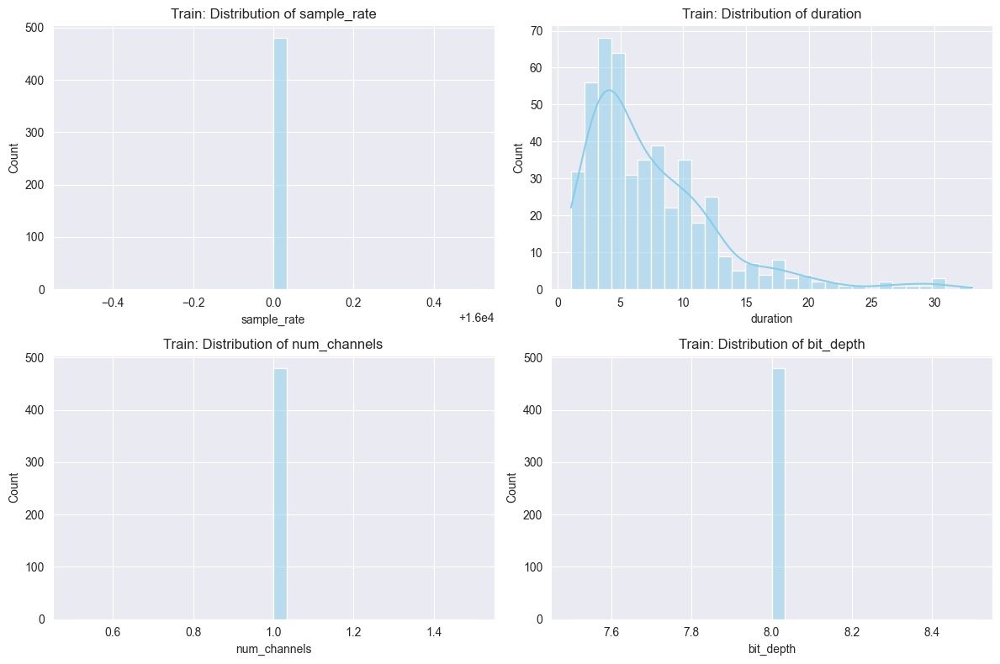

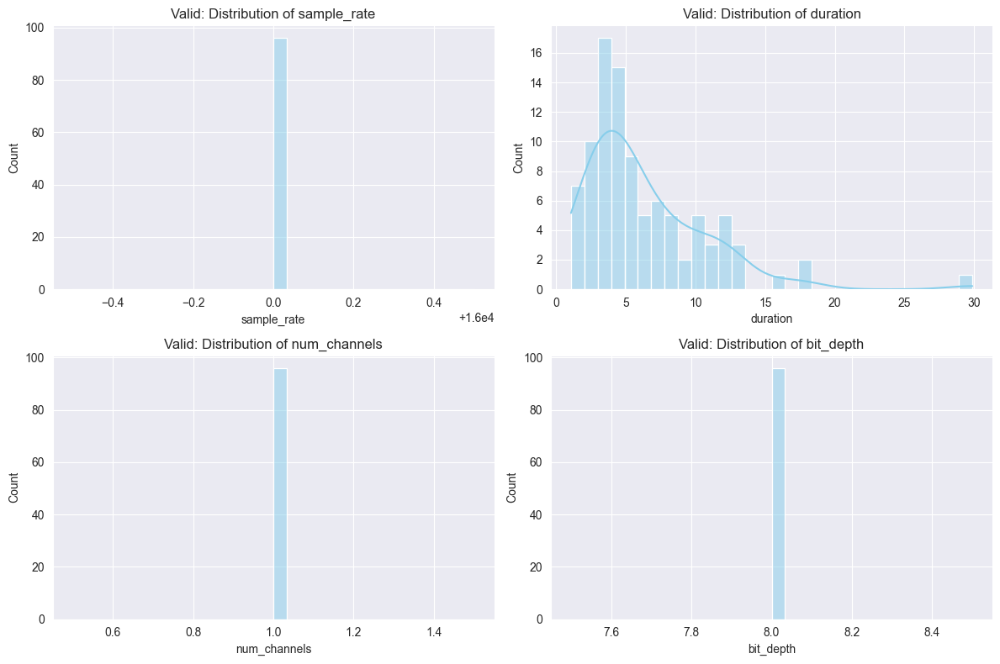

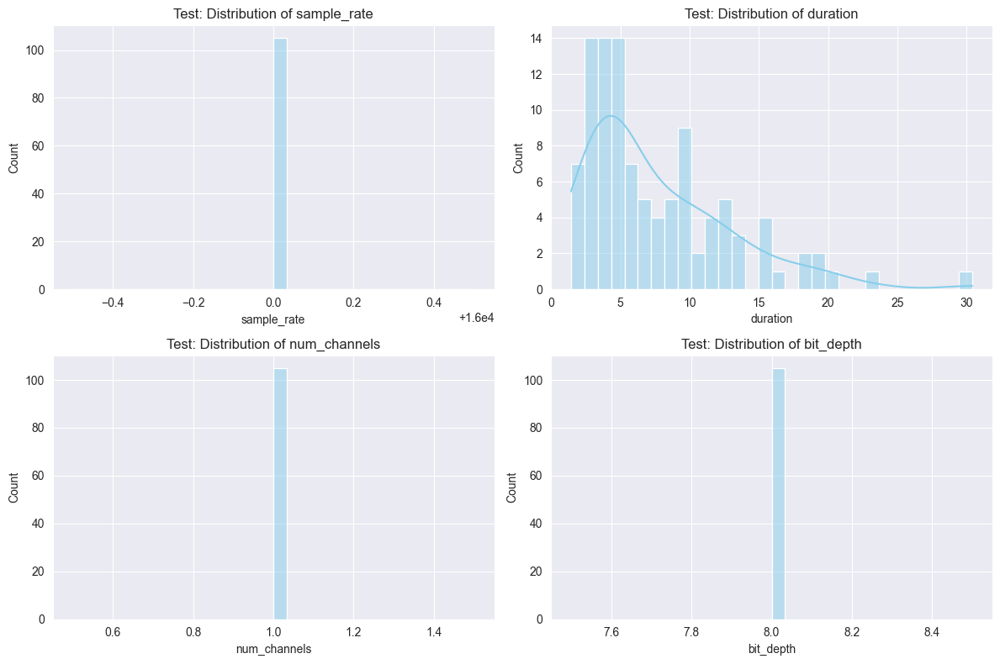

In [25]:
def plot_metadata_distribution(df, name):

    cols = df.columns[:4]

    plt.figure(figsize=(12, 8))

    for i, col in enumerate(cols, 1):
        plt.subplot(2, 2, i)
        sns.histplot(df[col], bins=30, kde=True, color='skyblue')
        plt.title(f'{name}: Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Count')

    plt.tight_layout()
    plt.show()

plot_metadata_distribution(train_filepath_meta, "Train")
plot_metadata_distribution(valid_filepath_meta, "Valid")
plot_metadata_distribution(test_filepath_meta, "Test")

In [27]:
def enrich_df_with_audiometa(input_df, func_get_audio_metadata):
    return pd.concat([
        input_df,
        pd.DataFrame(input_df["path"].apply(func_get_audio_metadata).to_list())
    ], axis=1)

train_df = enrich_df_with_audiometa(train_df, get_train_audio_metadata)
valid_df = enrich_df_with_audiometa(valid_df, get_valid_audio_metadata)
test_df  = enrich_df_with_audiometa(test_df, get_test_audio_metadata)

In [28]:
# Original code from https://www.kaggle.com/code/mmoreaux/esc50-visualization and modified with Chat GPT

def plot_audio_spectrograms_from_df(df, base_path, num_samples=10):

    num_samples = min(num_samples, len(df))
    sample_idxs = np.random.choice(len(df), size=num_samples, replace=False)

    file_paths = [os.path.join(base_path, df["path"].iloc[i]) for i in sample_idxs]
    class_names = [df["target"].iloc[i] for i in sample_idxs]

    num_files = len(file_paths)
    num_cols = 5
    num_rows = math.ceil(num_files / num_cols) * 2

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(13, num_rows * 2))

    if num_rows == 2:
        axs = np.reshape(axs, (num_rows, num_cols))

    for idx, file_path in enumerate(file_paths):
        try:
            waveform, sample_rate = torchaudio.load(file_path)
            waveform = waveform.numpy().T

            sampleFreqs, segmentTimes, sxx = signal.spectrogram(waveform[:, 0], sample_rate)

            i, j = (idx // num_cols) * 2, idx % num_cols
            axs[i][j].pcolormesh((len(segmentTimes)*segmentTimes/segmentTimes[-1]), sampleFreqs,
                                 10 * np.log10(sxx + 1e-15))
            axs[i][j].set_title(f"{class_names[idx]}", fontsize=10)
            axs[i][j].set_axis_off()

            axs[i+1][j].plot(waveform)
            axs[i+1][j].set_axis_off()
        except Exception as e:
            print(f"Error processing {file_path}: {e}")

    plt.tight_layout()
    plt.show()

    for idx, file_path in enumerate(file_paths):
        try:
            waveform, sample_rate = torchaudio.load(file_path)
            waveform = waveform.numpy().T
            print(f"Playing: {class_names[idx]}")
            ipd.display(ipd.Audio(waveform[:, 0], rate=sample_rate))
        except Exception as e:
            print(f"Error playing {file_path}: {e}")

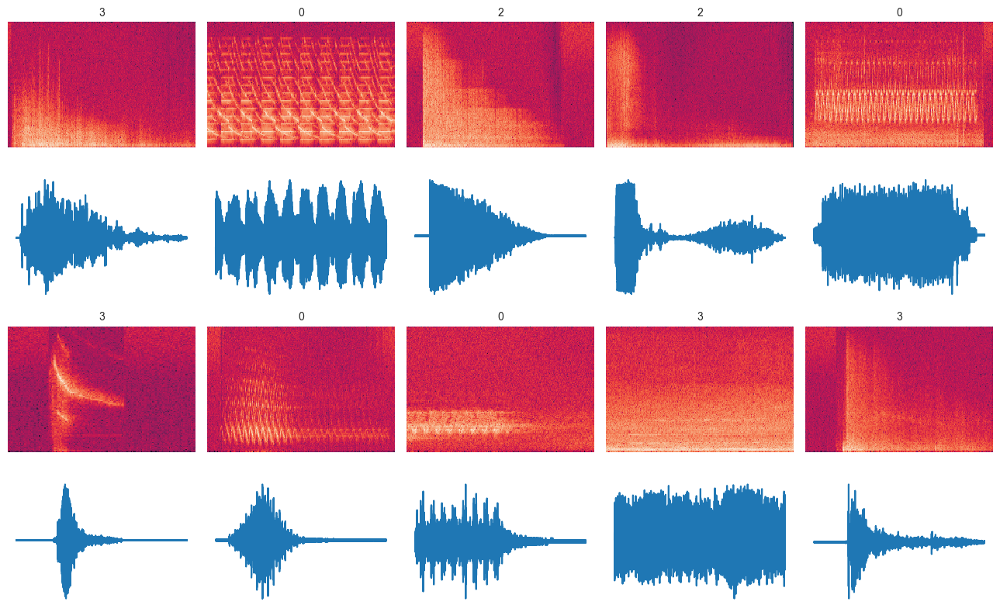

Playing: 3


Playing: 0


Playing: 2


Playing: 2


Playing: 0


Playing: 3


Playing: 0


Playing: 0


Playing: 3


Playing: 3


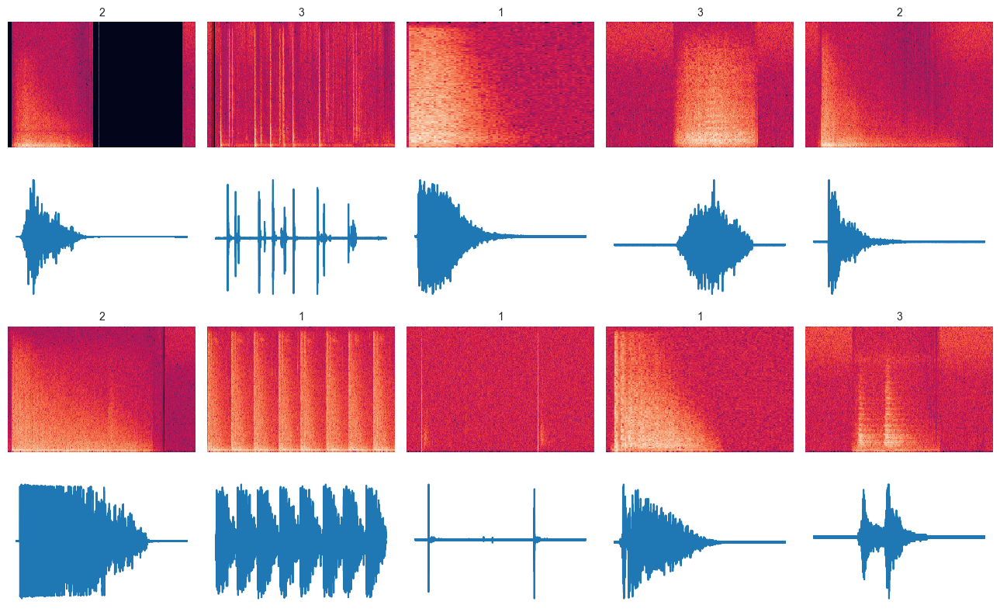

Playing: 2


Playing: 3


Playing: 1


Playing: 3


Playing: 2


Playing: 2


Playing: 1


Playing: 1


Playing: 1


Playing: 3


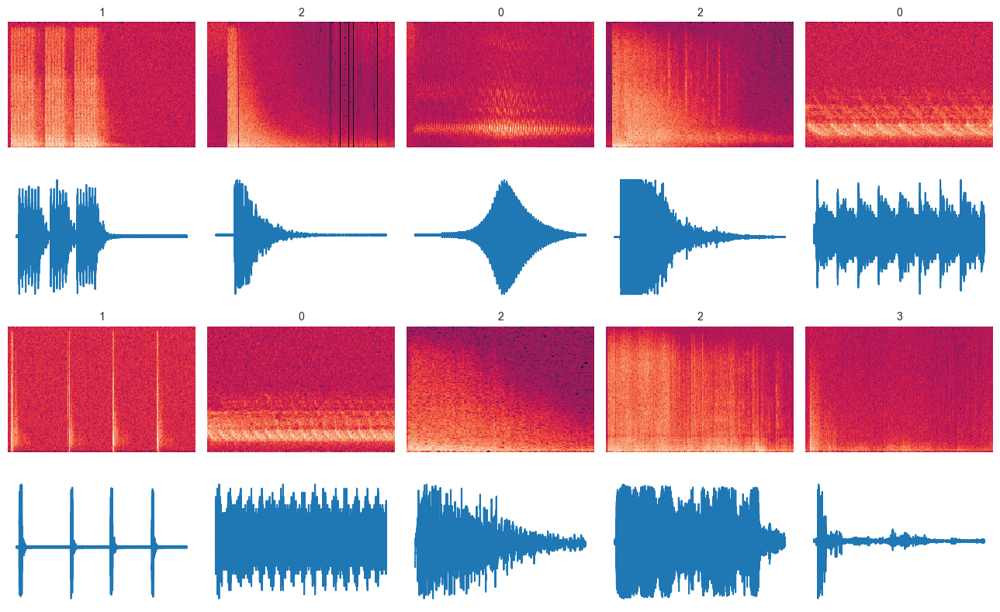

Playing: 1


Playing: 2


Playing: 0


Playing: 2


Playing: 0


Playing: 1


Playing: 0


Playing: 2


Playing: 2


Playing: 3


In [30]:
# Train
plot_audio_spectrograms_from_df(train_df, TRAIN_DIR_PATH, num_samples=10)

# Valid
plot_audio_spectrograms_from_df(valid_df, VALID_DIR_PATH, num_samples=10)

# Test
plot_audio_spectrograms_from_df(test_df, TEST_DIR_PATH, num_samples=10)